In [1]:
# DASK client set

import os
import sys
from dask.distributed import Client
# client = Client(scheduler_file='/proj/kimyy/Dropbox/source/python/all/mpi/scheduler.json', threads_per_worker=2, n_workers=6)
# client = Client(scheduler_file='/proj/kimyy/Dropbox/source/python/all/mpi/scheduler.json')
client = Client(scheduler_file='/proj/kimyy/Dropbox/source/python/all/mpi/scheduler_10.json')  

# add private module path for workers
# client.run(lambda: os.environ.update({'PYTHONPATH': '/proj/kimyy/Dropbox/source/python/all/Modules/CESM2'}))
# def add_path():
#     if '/proj/kimyy/Dropbox/source/python/all/Modules/CESM2' not in sys.path:
#         sys.path.append('/proj/kimyy/Dropbox/source/python/all/Modules/CESM2')

# client.run(add_path)

def setup_module_path():
    module_path = '/proj/kimyy/Dropbox/source/python/all/Modules/CESM2'
    if module_path not in sys.path:
        sys.path.append(module_path)

client.run(setup_module_path)

client

# get path for path changes in Jupyter notebook: File - Open from Path - insert relative_path
notebook_path = os.path.abspath(".")
_, _, relative_path = notebook_path.partition('/all/')
relative_path = '/all/' + relative_path
relative_path

'/all/Model/CESM2/Earth_System_Predictability/ASSM/Aleph'

# Load modules

In [2]:
# load public modules

import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as patches
import matplotlib.ticker as mticker
import matplotlib.path as mpath
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from scipy import stats
from scipy.interpolate import griddata
import cmocean
from cmcrameri import cm
import warnings
warnings.simplefilter(action='ignore')
import pandas as pd
import cftime
import pop_tools
from pprint import pprint
import time
import subprocess
import re as re_mod
import cftime
import datetime
from scipy.stats import ttest_1samp

In [3]:
# load private modules

import sys
sys.path.append('/proj/kimyy/Dropbox/source/python/all/Modules/CESM2')
from KYY_CESM2_preprocessing import CESM2_config
# import KYY_CESM2_preprocessing
# import importlib
# importlib.reload(KYY_CESM2_preprocessing)

# Variable configuration

In [41]:
cfg_var=CESM2_config()
cfg_var.year_s=1960
cfg_var.year_e=2020
cfg_var.setvar('SSH')
cfg_var.list()

cfg_var_NPP=CESM2_config()
cfg_var_NPP.year_s=1960
cfg_var_NPP.year_e=2020
cfg_var_NPP.setvar('photoC_TOT_zint_100m')

if cfg_var.comp=='ocn':
    ds_grid = pop_tools.get_grid('POP_gx1v7')

{'codebase': 'e21',
 'comp': 'ocn',
 'compset': 'b',
 'dimension': 'time '
              'nlat '
              'nlon',
 'long_name': 'SSH**2',
 'model': 'pop.h',
 'ndim': 3,
 'resol': 'f09_g17',
 'tfreq': 'month_1',
 'unit': 'cm^2',
 'var': 'SSH',
 'year_e': 2020,
 'year_s': 1960}


# Read dataset

In [56]:
# define preprocessing function

exceptcv=['time','lon','lat','lev', 'TLONG', 'TLAT', 'z_w', cfg_var.var, cfg_var_NPP.var]
def process_coords(ds, sd, ed, drop=True, except_coord_vars=exceptcv):
    """Preprocessor function to drop all non-dim coords, which slows down concatenation."""
    coord_vars = []
    for v in np.array(ds.coords) :
        if not v in except_coord_vars:
            coord_vars += [v]
    for v in np.array(ds.data_vars) :
        if not v in except_coord_vars:
            coord_vars += [v]
    
    if drop:
        ds= ds.drop(coord_vars)
        ds= ds.sel(time=slice(sd, ed))
        return ds
    else:
        return ds.set_coords(coord_vars)


start_date = cftime.DatetimeNoLeap(cfg_var.year_s, 2, 1)
end_date = cftime.DatetimeNoLeap(cfg_var.year_e+1, 1, 1)


def process_coords_hcst(ds, drop=True, except_coord_vars=['time','lon','lat', 'TLONG', 'TLAT', cfg_var.var, cfg_var_NPP.var]):
    """Preprocessor function to drop all non-dim coords, which slows down concatenation."""
    coord_vars = []
    for v in np.array(ds.coords) :
        if not v in except_coord_vars:
            coord_vars += [v]
    for v in np.array(ds.data_vars) :
        if not v in except_coord_vars:
            coord_vars += [v]
    
    if drop:
        ds= ds.drop(coord_vars)
        return ds
    else:
        return ds.set_coords(coord_vars)

In [6]:
# Read Hindcast dataset
start_time = time.time()

cfg_var.HCST_path_load(cfg_var.var)

cfg_var.HCST_ds = []
for iyear in range(0, len(cfg_var.HCST_file_list)):
    HCST_ds_tmp = xr.open_mfdataset(cfg_var.HCST_file_list[iyear], 
                           chunks={'time': 12}, 
                           combine='nested',
                           concat_dim=[[*cfg_var.HCST_ensembles]], 
                           parallel=True,
                           preprocess=lambda ds: process_coords_hcst(ds),
                           decode_cf=True, 
                           decode_times=True)
    HCST_ds_tmp['time_values'] = HCST_ds_tmp['time'].values
    HCST_ds_tmp = HCST_ds_tmp.rename({"time": "lmonths"})
    HCST_ds_tmp['lmonths']=range(1,61)
    HCST_ds_tmp = HCST_ds_tmp.assign(time_values=("lmonths", HCST_ds_tmp['time_values'].values))  # time 값을 lmonths 차원과 연결

    HCST_ds_tmp
    
    HCST_ds_a= []
    HCST_ds_a.append(HCST_ds_tmp)
    HCST_ds_xr = xr.concat(HCST_ds_a, dim='lmonths')
    HCST_ds_xr = HCST_ds_xr.expand_dims({'iyear': 1})
    
    cfg_var.HCST_ds.append(HCST_ds_xr)

cfg_var.HCST_ds = xr.concat(cfg_var.HCST_ds, dim='iyear')
cfg_var.HCST_ds = cfg_var.HCST_ds.rename({"concat_dim": "ens_HCST"})
cfg_var.HCST_ds['iyear']=range(cfg_var.year_s, cfg_var.year_e+1)

# time_values의 차원에 맞는 timedelta 배열 생성
timedelta_array = np.full(cfg_var.HCST_ds.time_values.shape, datetime.timedelta(days=15))
# time_values에서 15일을 뺀 새로운 time_values 생성
new_time = cfg_var.HCST_ds.time_values - timedelta_array
# 새로운 time_values로 업데이트
cfg_var.HCST_ds = cfg_var.HCST_ds.assign(time_values=new_time)

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading HCST: ' + str(elapsed_time))

elasped time for reading HCST: 288.6695306301117


In [7]:
cfg_var.HCST_ds

<xarray.Dataset>
Dimensions:      (iyear: 61, ens_HCST: 20, nlat: 384, nlon: 320, lmonths: 60)
Coordinates:
    TLONG        (iyear, ens_HCST, nlat, nlon) float64 dask.array<chunksize=(1, 1, 384, 320), meta=np.ndarray>
    TLAT         (iyear, ens_HCST, nlat, nlon) float64 dask.array<chunksize=(1, 1, 384, 320), meta=np.ndarray>
  * lmonths      (lmonths) int64 1 2 3 4 5 6 7 8 9 ... 53 54 55 56 57 58 59 60
  * ens_HCST     (ens_HCST) int64 0 1 2 3 4 5 6 7 8 ... 12 13 14 15 16 17 18 19
    time_values  (iyear, lmonths) object 1960-01-17 00:00:00 ... 2024-12-17 0...
  * iyear        (iyear) int64 1960 1961 1962 1963 1964 ... 2017 2018 2019 2020
Dimensions without coordinates: nlat, nlon
Data variables:
    SSH          (iyear, ens_HCST, lmonths, nlat, nlon) float32 dask.array<chunksize=(1, 1, 12, 384, 320), meta=np.ndarray>
Attributes:
    title:             f09_g17.hcst.en4.2_ba-10p1_i1960
    history:           none
    Conventions:       CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netcdf/CF-cu...
    time_period_freq:  month_1
    model_doi_url:     https://doi.org/10.5065/D67H1H0V
    contents:          Diagnostic and Prognostic Variables
    source:            CCSM POP2, the CCSM Ocean Component
    revision:          $Id$
    calendar:          All years have exactly  365 days.
    start_time:        This dataset was created on 2022-10-21 at 13:28:45.5
    cell_methods:      cell_methods = time: mean ==> the variable values are ...

In [57]:
# Read LE dataset

start_time = time.time()


cfg_var.LE_path_load(cfg_var.var)
cfg_var.LE_ds = xr.open_mfdataset(cfg_var.LE_file_list[0], 
                       chunks={'time': 12}, 
                       combine='nested', 
                       concat_dim=[[*cfg_var.LE_ensembles], 'time'], 
                       parallel=True,
                       preprocess=lambda ds: process_coords(ds, start_date, end_date),
                       decode_cf=True, 
                       decode_times=True)      


cfg_var.LE_ds = cfg_var.LE_ds.rename({"concat_dim": "ens_LE"})
new_time = cfg_var.LE_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var.LE_ds.time))
cfg_var.LE_ds = cfg_var.LE_ds.assign_coords(time=new_time)

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading LE: ' + str(elapsed_time))

elasped time for reading LE: 104.16945886611938


In [58]:
# Read LE dataset (NPP)

start_time = time.time()


cfg_var_NPP.LE_path_load(cfg_var_NPP.var)
cfg_var_NPP.LE_ds = xr.open_mfdataset(cfg_var_NPP.LE_file_list[0], 
                       chunks={'time': 12}, 
                       combine='nested', 
                       concat_dim=[[*cfg_var_NPP.LE_ensembles], 'time'], 
                       parallel=True,
                       preprocess=lambda ds: process_coords(ds, start_date, end_date),
                       decode_cf=True, 
                       decode_times=True)      


cfg_var_NPP.LE_ds = cfg_var_NPP.LE_ds.rename({"concat_dim": "ens_LE"})
new_time = cfg_var_NPP.LE_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_NPP.LE_ds.time))
cfg_var_NPP.LE_ds = cfg_var_NPP.LE_ds.assign_coords(time=new_time)

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading LE: ' + str(elapsed_time))

elasped time for reading LE: 81.75583958625793


In [9]:
# Read ODA dataset (all)

start_time = time.time()

cfg_var.ODA_path_load(cfg_var.var)

ODA_ds = xr.open_mfdataset(cfg_var.ODA_file_list[0][0:10],
                           chunks={'time': 12}, 
                           combine='nested', 
                           concat_dim=[[*cfg_var.ODA_ensembles[0:10]], 'time'], 
                           parallel=True,
                           preprocess=lambda ds: process_coords(ds, start_date, end_date),
                           decode_cf=True, 
                           decode_times=True)

ODA_ds2 = xr.open_mfdataset(cfg_var.ODA_file_list[0][10:20], 
                           chunks={'time': 12}, 
                           combine='nested', 
                           concat_dim=[[*cfg_var.ODA_ensembles[10:20]], 'time'], 
                           parallel=True,
                           preprocess=lambda ds: process_coords(ds, start_date, end_date),
                           decode_cf=True, 
                           decode_times=True)

# en4.2 -> until 2021; projdv7.3 -> until 2020; need to be read separately
ODA_ds_a = []
ODA_ds_a.append(ODA_ds)
ODA_ds_xr = xr.concat(ODA_ds_a, dim='time')
ODA_ds_xr = ODA_ds_xr.expand_dims({'ens': range(10)})

ODA_ds2_a = []
ODA_ds2_a.append(ODA_ds2)
ODA_ds2_xr = xr.concat(ODA_ds2_a, dim='time')
ODA_ds2_xr = ODA_ds2_xr.expand_dims({'ens': range(10, 20)})

cfg_var.ODA_ds = []
cfg_var.ODA_ds.append(ODA_ds_xr)
cfg_var.ODA_ds.append(ODA_ds2_xr)
cfg_var.ODA_ds = xr.concat(cfg_var.ODA_ds, dim='ens')
cfg_var.ODA_ds = cfg_var.ODA_ds.reindex(ens=list(range(1, 20+1)))
cfg_var.ODA_ds = cfg_var.ODA_ds.sortby('time')

cfg_var.ODA_ds = cfg_var.ODA_ds.rename({"concat_dim": "ens_ODA"})
new_time = cfg_var.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var.ODA_ds.time))
cfg_var.ODA_ds = cfg_var.ODA_ds.assign_coords(time=new_time)
cfg_var.ODA_ds = cfg_var.ODA_ds.drop('ens')
cfg_var.ODA_ds=cfg_var.ODA_ds.mean(dim='ens')
end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading ODA: ' + str(elapsed_time))

elasped time for reading ODA: 91.622309923172


In [62]:
# Read ODA dataset (all) (NPP)

start_time = time.time()

cfg_var_NPP.ODA_path_load(cfg_var_NPP.var)

ODA_ds = xr.open_mfdataset(cfg_var_NPP.ODA_file_list[0][0:10],
                           chunks={'time': 12}, 
                           combine='nested', 
                           concat_dim=[[*cfg_var_NPP.ODA_ensembles[0:10]], 'time'], 
                           parallel=True,
                           preprocess=lambda ds: process_coords(ds, start_date, end_date),
                           decode_cf=True, 
                           decode_times=True)

ODA_ds2 = xr.open_mfdataset(cfg_var_NPP.ODA_file_list[0][10:20], 
                           chunks={'time': 12}, 
                           combine='nested', 
                           concat_dim=[[*cfg_var_NPP.ODA_ensembles[10:20]], 'time'], 
                           parallel=True,
                           preprocess=lambda ds: process_coords(ds, start_date, end_date),
                           decode_cf=True, 
                           decode_times=True)

# en4.2 -> until 2021; projdv7.3 -> until 2020; need to be read separately
ODA_ds_a = []
ODA_ds_a.append(ODA_ds)
ODA_ds_xr = xr.concat(ODA_ds_a, dim='time')
ODA_ds_xr = ODA_ds_xr.expand_dims({'ens': range(10)})

ODA_ds2_a = []
ODA_ds2_a.append(ODA_ds2)
ODA_ds2_xr = xr.concat(ODA_ds2_a, dim='time')
ODA_ds2_xr = ODA_ds2_xr.expand_dims({'ens': range(10, 20)})

cfg_var_NPP.ODA_ds = []
cfg_var_NPP.ODA_ds.append(ODA_ds_xr)
cfg_var_NPP.ODA_ds.append(ODA_ds2_xr)
cfg_var_NPP.ODA_ds = xr.concat(cfg_var_NPP.ODA_ds, dim='ens')
cfg_var_NPP.ODA_ds = cfg_var_NPP.ODA_ds.reindex(ens=list(range(1, 20+1)))
cfg_var_NPP.ODA_ds = cfg_var_NPP.ODA_ds.sortby('time')

cfg_var_NPP.ODA_ds = cfg_var_NPP.ODA_ds.rename({"concat_dim": "ens_ODA"})
new_time = cfg_var_NPP.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var_NPP.ODA_ds.time))
cfg_var_NPP.ODA_ds = cfg_var_NPP.ODA_ds.assign_coords(time=new_time)
cfg_var_NPP.ODA_ds = cfg_var_NPP.ODA_ds.drop('ens')
cfg_var_NPP.ODA_ds=cfg_var_NPP.ODA_ds.mean(dim='ens')
end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading ODA: ' + str(elapsed_time))

elasped time for reading ODA: 65.2893123626709


In [10]:
# # Read ODA dataset (projd only)
# start_time = time.time()

# cfg_var.ODA_path_load(cfg_var.var)

# cfg_var.ODA_ds = xr.open_mfdataset(cfg_var.ODA_file_list[0][10:20], 
#                            chunks={'time': 2}, 
#                            combine='nested', 
#                            concat_dim=[[*cfg_var.ODA_ensembles[10:20]], 'time'], 
#                            parallel=True,
#                            preprocess=lambda ds: process_coords(ds, start_date, end_date),
#                            decode_cf=True, 
#                            decode_times=True)

# cfg_var.ODA_ds = cfg_var.ODA_ds.rename({"concat_dim": "ens_ODA"})
# new_time = cfg_var.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var.ODA_ds.time))
# cfg_var.ODA_ds = cfg_var.ODA_ds.assign_coords(time=new_time)

# end_time = time.time()
# elapsed_time = end_time - start_time
# print('elasped time for reading ODA: ' + str(elapsed_time))

In [74]:
# Read Observation dataset
start_time = time.time()

cfg_var.OBS_path_load(cfg_var.var)
# cfg_var.OBS_ds = xr.open_mfdataset(cfg_var.OBS_file_list[0][0], 
#                        combine='nested',
#                        concat_dim= 'time',
#                        chunks={'time': 6}, 
#                        parallel=True,
#                        preprocess=lambda ds: process_coords(ds, start_date, end_date),
#                        decode_cf=True, 
#                        decode_times=True,
#                        engine='h5netcdf')
cfg_var.OBS_ds = xr.open_mfdataset(cfg_var.OBS_file_list[0][0], 
                       chunks={'time': 12}, 
                       parallel=True,
                       decode_cf=True, 
                       decode_times=True,)
cfg_var.OBS_ds = cfg_var.OBS_ds.rename({cfg_var.OBS_var: cfg_var.var})

if cfg_var.var=='SSH':
    cfg_var.OBS_ds=cfg_var.OBS_ds.assign_coords(time=cfg_var.ODA_ds.time[396:732])
elif cfg_var.var=='photoC_TOT_zint_100m':
    cfg_var.OBS_ds=cfg_var.OBS_ds.assign_coords(time=cfg_var.ODA_ds.time[456:732])
cfg_var.OBS_ds.time

# global mean removal for SSH
if cfg_var.var=='SSH':
    lat_mask = (ds_grid.TLAT >= -60) & (ds_grid.TLAT <= 60)

    area_selected = ds_grid.TAREA.where(lat_mask, drop=True)  # 선택된 지역의 면적
    ssh_selected = cfg_var.OBS_ds[cfg_var.var].where(lat_mask, drop=True)  # 선택된 지역의 SSH 데이터

    # 필터링된 지역에 대해 global mean 계산
    cfg_var.OBS_ds['gm'] = (ssh_selected * area_selected).sum(dim=['nlat', 'nlon']) / area_selected.sum(dim=['nlat', 'nlon'])
    
    # 원 데이터에서 global mean을 제거한 값
    cfg_var.OBS_ds['SSH'] = cfg_var.OBS_ds[cfg_var.var] - cfg_var.OBS_ds['gm']


# Step 1: 결측값이 아닌 값의 비율 계산
# 결측값이 아닌 값들에 대해 True, 결측값에 대해 False로 표시
valid_data_count = (~cfg_var.OBS_ds[cfg_var.var].isnull()).sum(dim='time')
# Step 2: 전체 시간 축의 길이 (즉, 데이터가 있어야 할 총 시간 개수)
total_time_steps = cfg_var.OBS_ds['time'].size
# Step 3: 80% 이상의 값이 있는지 계산
# 비율 계산 후, 80% 이상이면 True, 그렇지 않으면 False로 표시
threshold = 0.8
mask = (valid_data_count / total_time_steps) >= threshold
# Step 4: 마스크 변수를 데이터셋에 추가
cfg_var.OBS_ds['mask_80_percent'] = mask
cfg_var.OBS_ds['mask_80_percent'].compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading OBS: ' + str(elapsed_time))

AttributeError: 'CESM2_config' object has no attribute 'ODA_ds'

In [60]:
# Read Observation dataset (NPP)
start_time = time.time()

cfg_var_NPP.OBS_path_load(cfg_var_NPP.var)
# cfg_var_NPP.OBS_ds = xr.open_mfdataset(cfg_var_NPP.OBS_file_list[0][0], 
#                        combine='nested',
#                        concat_dim= 'time',
#                        chunks={'time': 6}, 
#                        parallel=True,
#                        preprocess=lambda ds: process_coords(ds, start_date, end_date),
#                        decode_cf=True, 
#                        decode_times=True,
#                        engine='h5netcdf')
cfg_var_NPP.OBS_ds = xr.open_mfdataset(cfg_var_NPP.OBS_file_list[0][0], 
                       chunks={'time': 12}, 
                       parallel=True,
                       decode_cf=True, 
                       decode_times=True,)
cfg_var_NPP.OBS_ds = cfg_var_NPP.OBS_ds.rename({cfg_var_NPP.OBS_var: cfg_var_NPP.var})

if cfg_var_NPP.var=='SSH':
    cfg_var_NPP.OBS_ds=cfg_var_NPP.OBS_ds.assign_coords(time=cfg_var_NPP.ODA_ds.time[396:732])
elif cfg_var_NPP.var=='photoC_TOT_zint_100m':
    cfg_var_NPP.OBS_ds=cfg_var_NPP.OBS_ds.assign_coords(time=cfg_var_NPP.ODA_ds.time[456:732])
cfg_var_NPP.OBS_ds.time

# global mean removal for SSH
if cfg_var_NPP.var=='SSH':
    lat_mask = (ds_grid.TLAT >= -60) & (ds_grid.TLAT <= 60)

    area_selected = ds_grid.TAREA.where(lat_mask, drop=True)  # 선택된 지역의 면적
    ssh_selected = cfg_var_NPP.OBS_ds[cfg_var_NPP.var].where(lat_mask, drop=True)  # 선택된 지역의 SSH 데이터

    # 필터링된 지역에 대해 global mean 계산
    cfg_var_NPP.OBS_ds['gm'] = (ssh_selected * area_selected).sum(dim=['nlat', 'nlon']) / area_selected.sum(dim=['nlat', 'nlon'])
    
    # 원 데이터에서 global mean을 제거한 값
    cfg_var_NPP.OBS_ds['SSH'] = cfg_var_NPP.OBS_ds[cfg_var_NPP.var] - cfg_var_NPP.OBS_ds['gm']


# Step 1: 결측값이 아닌 값의 비율 계산
# 결측값이 아닌 값들에 대해 True, 결측값에 대해 False로 표시
valid_data_count = (~cfg_var_NPP.OBS_ds[cfg_var_NPP.var].isnull()).sum(dim='time')
# Step 2: 전체 시간 축의 길이 (즉, 데이터가 있어야 할 총 시간 개수)
total_time_steps = cfg_var_NPP.OBS_ds['time'].size
# Step 3: 80% 이상의 값이 있는지 계산
# 비율 계산 후, 80% 이상이면 True, 그렇지 않으면 False로 표시
threshold = 0.8
mask = (valid_data_count / total_time_steps) >= threshold
# Step 4: 마스크 변수를 데이터셋에 추가
cfg_var_NPP.OBS_ds['mask_80_percent'] = mask
cfg_var_NPP.OBS_ds['mask_80_percent'].compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading OBS: ' + str(elapsed_time))

elasped time for reading OBS: 24.749268054962158


# Take annual means

In [13]:
# obs_non_nan_times = cfg_var.OBS_ds.notnull()
# ada_filtered = cfg_var.ADA_ds.sel(time=obs_non_nan_times)

# Step 1: OBS_ds에서 NaN이 아닌 시간대에 해당하는 boolean mask 생성
obs_non_nan_times = cfg_var.OBS_ds[cfg_var.var].notnull().any(dim=['nlat', 'nlon'])
# Step 2: boolean mask를 명시적으로 계산 (compute() 호출)
obs_non_nan_times = obs_non_nan_times.compute()
# Step 3: NaN이 아닌 시간대에 해당하는 time 좌표 추출
non_nan_time_coords = cfg_var.OBS_ds.time.where(obs_non_nan_times, drop=True)
# Step 4: ADA_ds에서 NaN이 아닌 시간대에 해당하는 자료만 선택
oda_filtered = cfg_var.ODA_ds.sel(time=non_nan_time_coords)
le_filtered = cfg_var.LE_ds.sel(time=non_nan_time_coords)

# Step 5: 연도별로 그룹화하고 NaN을 무시한 연평균 계산
oda_annual_mean = oda_filtered.groupby('time.year').mean(dim='time', skipna=True)
le_annual_mean = le_filtered.groupby('time.year').mean(dim='time', skipna=True)
obs_annual_mean = cfg_var.OBS_ds.groupby('time.year').mean(dim='time', skipna=True)

oda_full_annual_mean = cfg_var.ODA_ds.groupby('time.year').mean(dim='time', skipna=True)
le_full_annual_mean = cfg_var.LE_ds.groupby('time.year').mean(dim='time', skipna=True)

ref_time=cfg_var.ODA_ds.time.groupby('time.year').mean(dim='time')

In [63]:
obs_non_nan_times_NPP = cfg_var_NPP.OBS_ds[cfg_var_NPP.var].notnull().any(dim=['nlat', 'nlon'])
obs_non_nan_times_NPP = obs_non_nan_times_NPP.compute()
non_nan_time_coords_NPP = cfg_var_NPP.OBS_ds.time.where(obs_non_nan_times_NPP, drop=True)

oda_filtered_NPP = cfg_var_NPP.ODA_ds.sel(time=non_nan_time_coords_NPP)
le_filtered_NPP = cfg_var_NPP.LE_ds.sel(time=non_nan_time_coords_NPP)

oda_annual_mean_NPP = oda_filtered_NPP.groupby('time.year').mean(dim='time', skipna=True)
le_annual_mean_NPP = le_filtered_NPP.groupby('time.year').mean(dim='time', skipna=True)
obs_annual_mean_NPP = cfg_var_NPP.OBS_ds.groupby('time.year').mean(dim='time', skipna=True)

In [14]:
# 4 year moving average
oda_rolling_mean = oda_annual_mean.rolling(year=4, min_periods=4).mean()
oda_rolling_time_mean = oda_annual_mean['year'].rolling(year=4, min_periods=4).mean()
oda_rolling_mean = oda_rolling_mean.assign_coords(year=oda_rolling_time_mean)
valid_index = np.where(~np.isnan(oda_rolling_mean['year']))[0]
oda_rolling_mean = oda_rolling_mean.isel(year=valid_index)

le_rolling_mean = le_annual_mean.rolling(year=4, min_periods=4).mean()
le_rolling_time_mean = le_annual_mean['year'].rolling(year=4, min_periods=4).mean()
le_rolling_mean = le_rolling_mean.assign_coords(year=le_rolling_time_mean)
valid_index = np.where(~np.isnan(le_rolling_mean['year']))[0]
le_rolling_mean = le_rolling_mean.isel(year=valid_index)

obs_rolling_mean = obs_annual_mean.rolling(year=4, min_periods=4).mean()
obs_rolling_time_mean = obs_annual_mean['year'].rolling(year=4, min_periods=4).mean()
obs_rolling_mean = obs_rolling_mean.assign_coords(year=obs_rolling_time_mean)
valid_index = np.where(~np.isnan(obs_rolling_mean['year']))[0]
obs_rolling_mean = obs_rolling_mean.isel(year=valid_index)

oda_full_rolling_mean = oda_full_annual_mean.rolling(year=4, min_periods=4).mean()
oda_full_rolling_time_mean = oda_full_annual_mean['year'].rolling(year=4, min_periods=4).mean()
oda_full_rolling_mean = oda_full_rolling_mean.assign_coords(year=oda_full_rolling_time_mean)
valid_index = np.where(~np.isnan(oda_full_rolling_mean['year']))[0]
oda_full_rolling_mean = oda_full_rolling_mean.isel(year=valid_index)

le_full_rolling_mean = le_full_annual_mean.rolling(year=4, min_periods=4).mean()
le_full_rolling_time_mean = le_full_annual_mean['year'].rolling(year=4, min_periods=4).mean()
le_full_rolling_mean = le_full_rolling_mean.assign_coords(year=le_full_rolling_time_mean)
valid_index = np.where(~np.isnan(le_full_rolling_mean['year']))[0]
le_full_rolling_mean = le_full_rolling_mean.isel(year=valid_index)

In [15]:
hcst_annual_mean = cfg_var.HCST_ds.groupby((cfg_var.HCST_ds.lmonths - 1) // 12).mean(dim='lmonths')
# 새로운 차원 이름을 원하는 대로 수정 (여기서는 'year')
hcst_annual_mean = hcst_annual_mean.rename({'lmonths': 'lyear'})

In [16]:
hcst_ly1_annual_mean = hcst_annual_mean[cfg_var.var].isel(lyear=0)
hcst_ly1_annual_mean = hcst_ly1_annual_mean.rename({'iyear': 'year'})
hcst_ly1_annual_mean= hcst_ly1_annual_mean.assign_coords(year=ref_time.year)
hcst_full_ly1_annual_mean = hcst_ly1_annual_mean
hcst_ly1_annual_mean = hcst_ly1_annual_mean.sel(year=obs_annual_mean.year)

In [17]:

hcst_ly2_5_annual_mean = hcst_annual_mean[cfg_var.var].isel(lyear=slice(1, 5)) # except of 0, 1:4 is selected
hcst_ly2_5_annual_mean=hcst_ly2_5_annual_mean.mean(dim='lyear')
hcst_ly2_5_annual_mean = hcst_ly2_5_annual_mean.rename({'iyear': 'year'})
hcst_ly2_5_annual_mean= hcst_ly2_5_annual_mean.assign_coords(year=ref_time.year + (1+4)/2)
hcst_full_ly2_5_annual_mean = hcst_ly2_5_annual_mean
hcst_ly2_5_annual_mean = hcst_ly2_5_annual_mean.sel(year=obs_rolling_mean.year)


In [18]:
# take ensemble mean, for increments (ODA-LE, HCST-LE)

# oda_annual_mean['enm']=oda_annual_mean[cfg_var.var].mean(dim='ens_ODA')
le_annual_mean['enm']=le_annual_mean[cfg_var.var].mean(dim='ens_LE')
# hcst_annual_mean['enm']=hcst_ly1_annual_mean.mean(dim='ens_HCST')

oda_annual_mean['diff_le']=oda_annual_mean[cfg_var.var] - le_annual_mean.enm
# ada_annual_mean['diff_oda']=ada_annual_mean[cfg_var.var] - oda_annual_mean.enm

In [65]:
le_annual_mean_NPP['enm']=le_annual_mean_NPP[cfg_var_NPP.var].mean(dim='ens_LE')
oda_annual_mean_NPP['diff_le']=oda_annual_mean_NPP[cfg_var_NPP.var] - le_annual_mean_NPP.enm

In [19]:
start_time = time.time()

corr_ODA_diff = xr.corr(oda_annual_mean.diff_le, getattr(obs_annual_mean,cfg_var.var), dim='year').compute()
# corr_LE = xr.corr(le_annual_mean[cfg_var.var], getattr(obs_annual_mean,cfg_var.var), dim='year').compute()
# corr_ODA = xr.corr(oda_annual_mean[cfg_var.var], getattr(obs_annual_mean,cfg_var.var), dim='year').compute()
corr_HCST = xr.corr(hcst_ly1_annual_mean, getattr(obs_annual_mean,cfg_var.var), dim='year').compute()
corr_HCST_ly2_5 = xr.corr(hcst_ly2_5_annual_mean, getattr(obs_rolling_mean,cfg_var.var), dim='year').compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for calculating correlation: ' + str(elapsed_time))

elasped time for calculating correlation: 265.7596263885498


In [67]:
corr_ODA_diff_NPP = xr.corr(oda_annual_mean_NPP.diff_le, getattr(obs_annual_mean_NPP,cfg_var_NPP.var), dim='year').compute()


In [20]:
start_time = time.time()

pp_HCST = xr.corr(hcst_full_ly1_annual_mean, oda_full_annual_mean[cfg_var.var], dim='year').compute()

common_years = np.intersect1d(hcst_full_ly2_5_annual_mean['year'], oda_full_rolling_mean['year'])
pp_HCST_ly2_5 = xr.corr(
    hcst_full_ly2_5_annual_mean.sel(year=common_years),
    oda_full_rolling_mean[cfg_var.var].sel(year=common_years),
    dim='year'
).compute()

# pp_HCST_ly2_5 = xr.corr(hcst_full_ly2_5_annual_mean, oda_full_rolling_mean[cfg_var.var], dim='year').compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for calculating correlation: ' + str(elapsed_time))

elasped time for calculating correlation: 615.9707641601562


In [21]:
def pop_add_cyclic(da):
        #copied from Mattew Longs github (https://gist.github.com/matt-long/50433da346da8ac17cde926eec90a87c) and modified for DA
        #This doesn't work with Dask (DA should be loaded)
        #Input DA must have the name and coords (TLONG and TLAT), and don't have other dims (time etc.)
        #Output is DA
        nj = da.TLAT.shape[0]
        ni = da.TLONG.shape[1]
        xL = int(ni/2 - 1)
        xR = int(xL + ni)
        tlon = da.TLONG.data
        tlat = da.TLAT.data
        tlon = np.where(np.greater_equal(tlon, min(tlon[:,0])), tlon-360., tlon)
        lon  = np.concatenate((tlon, tlon + 360.), 1)
        lon = lon[:, xL:xR]
        if ni == 320:
            lon[367:-3, 0] = lon[367:-3, 0] + 360.
        lon = lon - 360.
        lon = np.hstack((lon, lon[:, 0:1] + 360.))
        if ni == 320:
            lon[367:, -1] = lon[367:, -1] - 360.
        #-- trick cartopy into doing the right thing:
        #   it gets confused when the cyclic coords are identical
        lon[:, 0] = lon[:, 0] - 1e-8
        #-- periodicity
        lat = np.concatenate((tlat, tlat), 1)
        lat = lat[:, xL:xR]
        lat = np.hstack((lat, lat[:,0:1]))
        TLAT = xr.DataArray(lat, dims=('nlat', 'nlon'))
        TLONG = xr.DataArray(lon, dims=('nlat', 'nlon'))
        # copy vars
        v = da.name
        v_dims = da.dims
        # determine and sort other dimensions
        other_dims = set(v_dims) - {'nlat', 'nlon'}
        other_dims = tuple([d for d in v_dims if d in other_dims])
        lon_dim = da.dims.index('nlon')
        field = da.data
        field = np.concatenate((field, field), lon_dim)
        field = field[:, xL:xR]
        field = np.concatenate((field, field[:, 0:1]), lon_dim)
        dao = xr.DataArray(field, dims=other_dims+('nlat', 'nlon'), attrs=da.attrs)
        dao = dao.assign_coords(TLONG=TLONG)
        dao = dao.assign_coords(TLAT=TLAT)
        return dao

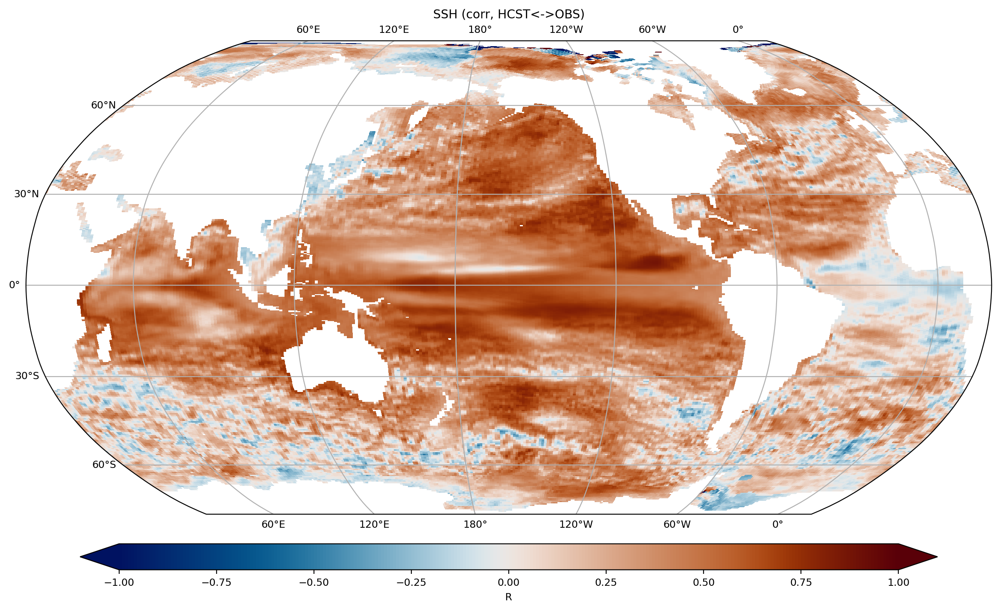

elasped time for calculating correlation: 8.743486881256104


In [22]:
# plot for HCST (LY1)

start_time = time.time()


varn=cfg_var.var #example

if cfg_var.comp=='ocn':
    ds_grid = pop_tools.get_grid('POP_gx1v7')

data_array=corr_HCST.median(dim='ens_HCST')

data_array.attrs['name'] = cfg_var.var

if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT

projection = ccrs.Robinson(central_longitude=200)

plt.rcParams.update({'font.size': 8.5})
fig, ax2 = plt.subplots(1, 1, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection})

cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}
if cfg_var.comp=='ocn' or cfg_var.comp=='ice':
    # plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=0.05, vmin=-0.05,cmap=cm.vik, cbar_kwargs=cbar_kwargs)
    plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, cbar_kwargs=cbar_kwargs)

else:
    plt1=data_array.isel(concat_dim=0).mean(dim='time').plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), vmax=30, vmin=0, cmap=cmocean.cm.deep, cbar_kwargs=cbar_kwargs)

ax2.set_title(f'{varn} (corr, HCST<->OBS)')
ax2.gridlines(draw_labels=True) 

ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for calculating correlation: ' + str(elapsed_time))

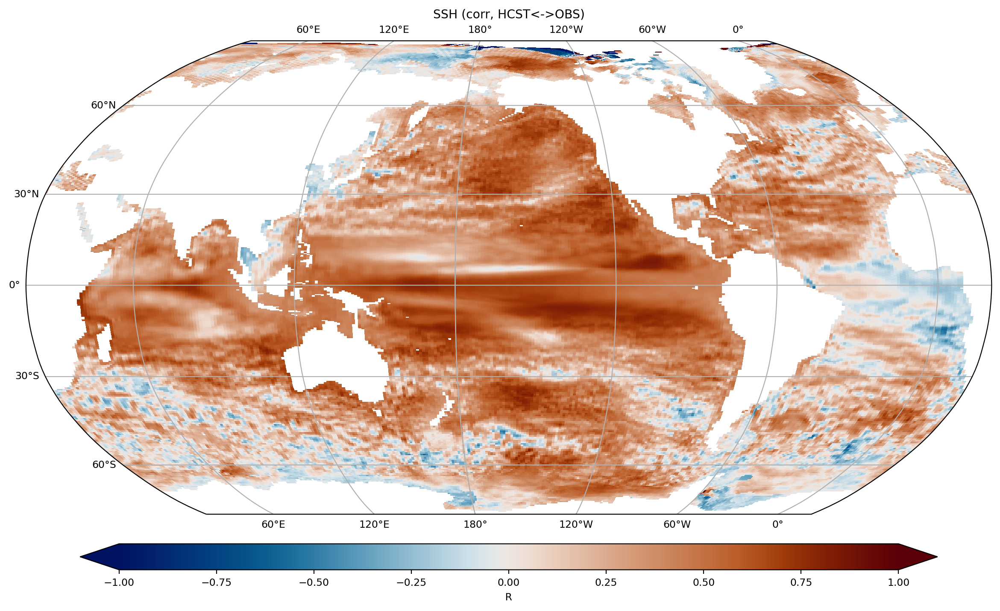

elasped time for calculating correlation: 4.534678936004639


In [23]:
# plot for HCST (LY1, projd only)

start_time = time.time()

varn=cfg_var.var #example

if cfg_var.comp=='ocn':
    ds_grid = pop_tools.get_grid('POP_gx1v7')

data_array=corr_HCST.isel(ens_HCST=slice(10, 20)).median(dim='ens_HCST')


data_array.attrs['name'] = cfg_var.var

if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT

projection = ccrs.Robinson(central_longitude=200)

plt.rcParams.update({'font.size': 8.5})
fig, ax2 = plt.subplots(1, 1, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection})

cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}
if cfg_var.comp=='ocn' or cfg_var.comp=='ice':
    # plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=0.05, vmin=-0.05,cmap=cm.vik, cbar_kwargs=cbar_kwargs)
    plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, cbar_kwargs=cbar_kwargs)

else:
    plt1=data_array.isel(concat_dim=0).mean(dim='time').plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), vmax=30, vmin=0, cmap=cmocean.cm.deep, cbar_kwargs=cbar_kwargs)

ax2.set_title(f'{varn} (corr, HCST<->OBS)')
ax2.gridlines(draw_labels=True) 

ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for calculating correlation: ' + str(elapsed_time))

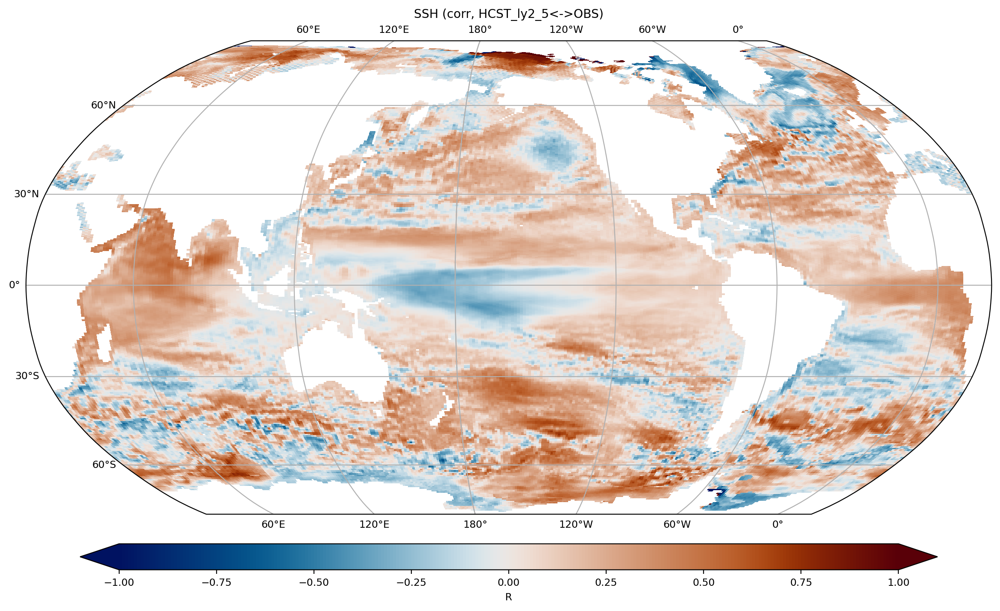

elasped time for calculating correlation: 4.1864142417907715


In [24]:
# plot for HCST (LY2-5)

start_time = time.time()

varn=cfg_var.var #example

if cfg_var.comp=='ocn':
    ds_grid = pop_tools.get_grid('POP_gx1v7')

data_array=corr_HCST_ly2_5.median(dim='ens_HCST')

data_array.attrs['name'] = cfg_var.var

if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT

projection = ccrs.Robinson(central_longitude=200)

plt.rcParams.update({'font.size': 8.5})
fig, ax2 = plt.subplots(1, 1, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection})

cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}
if cfg_var.comp=='ocn' or cfg_var.comp=='ice':
    plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, cbar_kwargs=cbar_kwargs)

else:
    plt1=data_array.isel(concat_dim=0).mean(dim='time').plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), vmax=30, vmin=0, cmap=cmocean.cm.deep, cbar_kwargs=cbar_kwargs)

ax2.set_title(f'{varn} (corr, HCST_ly2_5<->OBS)')
ax2.gridlines(draw_labels=True) 

ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for calculating correlation: ' + str(elapsed_time))

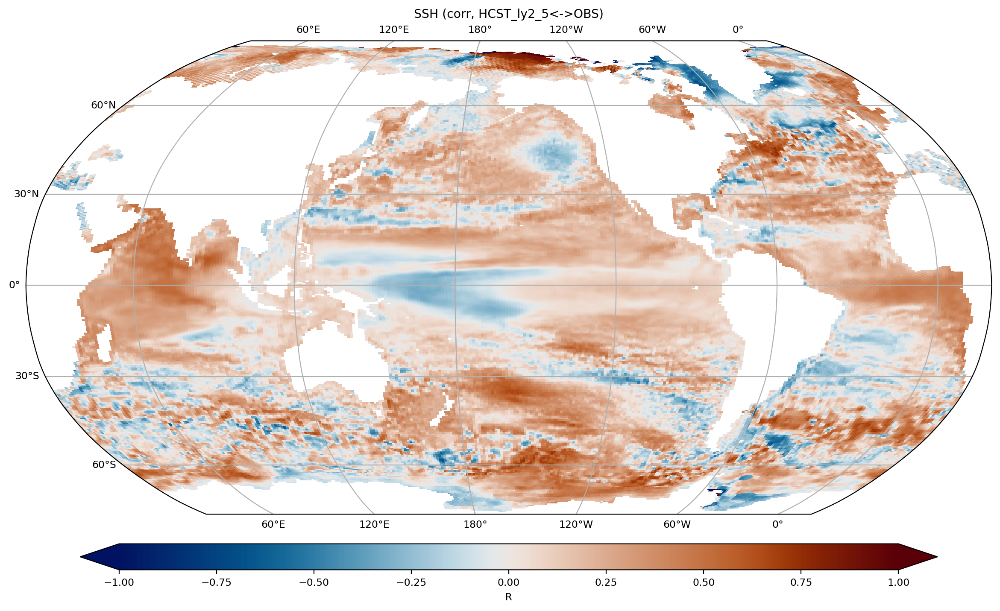

elasped time for plot: 4.145112037658691


In [25]:
# plot for HCST (LY2-5, projd only)

start_time = time.time()

varn=cfg_var.var #example

if cfg_var.comp=='ocn':
    ds_grid = pop_tools.get_grid('POP_gx1v7')

data_array=corr_HCST_ly2_5.isel(ens_HCST=slice(10, 20)).median(dim='ens_HCST')

data_array.attrs['name'] = cfg_var.var

if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT

projection = ccrs.Robinson(central_longitude=200)

plt.rcParams.update({'font.size': 8.5})
fig, ax2 = plt.subplots(1, 1, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection})

cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}
if cfg_var.comp=='ocn' or cfg_var.comp=='ice':
    plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, cbar_kwargs=cbar_kwargs)

else:
    plt1=data_array.isel(concat_dim=0).mean(dim='time').plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), vmax=30, vmin=0, cmap=cmocean.cm.deep, cbar_kwargs=cbar_kwargs)

ax2.set_title(f'{varn} (corr, HCST_ly2_5<->OBS)')
ax2.gridlines(draw_labels=True) 

ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for plot: ' + str(elapsed_time))

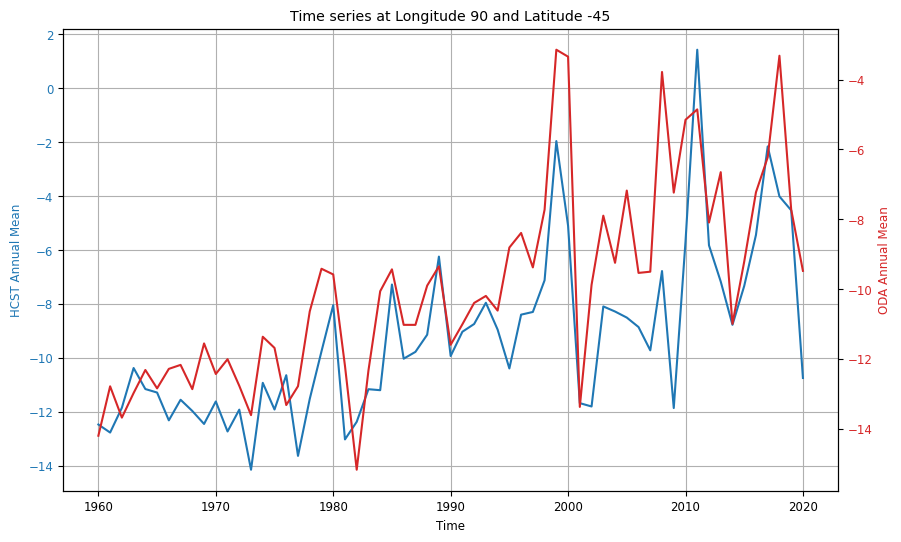

In [26]:
# 경도와 위도 설정 (예: 120W, 60S)
target_lon = 90
target_lat = -45

# Step 1: obs_annual_mean에서 해당 좌표의 타임시리즈 추출
distance_obs = np.sqrt((obs_annual_mean.TLONG - target_lon)**2 + (obs_annual_mean.TLAT - target_lat)**2)
min_distance_idx_obs = np.unravel_index(np.argmin(distance_obs.values), distance_obs.shape)
nlat_idx_obs, nlon_idx_obs = min_distance_idx_obs

hcst_full_timeseries_data = hcst_full_ly1_annual_mean.sel(nlon=nlon_idx_obs, nlat=nlat_idx_obs)
hcst_full_timeseries_data_var = hcst_full_timeseries_data.mean(dim='ens_HCST')  # 원하는 변수 선택

oda_full_timeseries_data = oda_full_annual_mean.sel(nlon=nlon_idx_obs, nlat=nlat_idx_obs)
oda_full_timeseries_data_var = oda_full_timeseries_data[cfg_var.var].mean(dim='ens_ODA')  # 원하는 변수 선택

# Step 3: 두 타임시리즈를 각각 왼쪽과 오른쪽 Y축에 플로팅
fig, ax1 = plt.subplots(figsize=(10, 6))

# 왼쪽 Y축 (obs_annual_mean)
color = 'tab:blue'
ax1.set_xlabel('Time')
ax1.set_ylabel('HCST Annual Mean', color=color)
ax1.plot(hcst_full_timeseries_data_var['year'], hcst_full_timeseries_data_var, color=color, label='HCST Annual Mean')
ax1.tick_params(axis='y', labelcolor=color)
ax1.grid(True)

# 오른쪽 Y축 (ada_annual_mean)
ax2 = ax1.twinx()  # 이중 Y축 설정
color = 'tab:red'
ax2.set_ylabel('ODA Annual Mean', color=color)
ax2.plot(oda_full_timeseries_data_var['year'], oda_full_timeseries_data_var, color=color, label='ODA Annual Mean')
ax2.tick_params(axis='y', labelcolor=color)

# 제목 설정
plt.title(f"Time series at Longitude {target_lon} and Latitude {target_lat}")

# 플롯 표시
plt.show()

In [27]:
# # 경도와 위도 설정 (예: 120W, 60S)
# target_lon = 90
# target_lat = 5

# # Step 1: obs_annual_mean에서 해당 좌표의 타임시리즈 추출
# distance_obs = np.sqrt((obs_annual_mean.TLONG - target_lon)**2 + (obs_annual_mean.TLAT - target_lat)**2)
# min_distance_idx_obs = np.unravel_index(np.argmin(distance_obs.values), distance_obs.shape)
# nlat_idx_obs, nlon_idx_obs = min_distance_idx_obs

# # HCST 및 ODA 데이터 추출
# hcst_full_timeseries_data = hcst_full_ly1_annual_mean.sel(nlon=nlon_idx_obs, nlat=nlat_idx_obs)
# oda_full_timeseries_data = oda_full_annual_mean[cfg_var.var].sel(nlon=nlon_idx_obs, nlat=nlat_idx_obs)

# # Step 2: HCST 및 ODA의 ensemble 평균 계산
# hcst_full_timeseries_data_mean = hcst_full_timeseries_data.mean(dim='ens_HCST')
# oda_full_timeseries_data_mean = oda_full_timeseries_data.mean(dim='ens_ODA')

# # Step 3: 두 타임시리즈를 각각 왼쪽과 오른쪽 Y축에 플로팅
# fig, ax1 = plt.subplots(figsize=(10, 6))

# # 왼쪽 Y축 (HCST ensemble mean)
# color = 'tab:blue'
# ax1.set_xlabel('Time')
# ax1.set_ylabel('HCST Annual Mean', color=color)
# ax1.plot(hcst_full_timeseries_data_mean['year'], hcst_full_timeseries_data_mean, color=color, label='HCST Ensemble Mean', linewidth=2)
# ax1.tick_params(axis='y', labelcolor=color)
# ax1.grid(True)

# # HCST 개별 ensemble 멤버들을 얇은 선으로 플롯
# for ens in hcst_full_timeseries_data['ens_HCST']:
#     ax1.plot(hcst_full_timeseries_data['year'], hcst_full_timeseries_data.sel(ens_HCST=ens), color=color, alpha=0.3, linewidth=0.8)

# # 오른쪽 Y축 (ODA ensemble mean)
# ax2 = ax1.twinx()  # 이중 Y축 설정
# color = 'tab:red'
# ax2.set_ylabel('ODA Annual Mean', color=color)
# ax2.plot(oda_full_timeseries_data_mean['year'], oda_full_timeseries_data_mean, color=color, label='ODA Ensemble Mean', linewidth=2)
# ax2.tick_params(axis='y', labelcolor=color)

# # ODA 개별 ensemble 멤버들을 얇은 선으로 플롯
# for ens in oda_full_timeseries_data['ens_ODA']:
#     ax2.plot(oda_full_timeseries_data['year'], oda_full_timeseries_data.sel(ens_ODA=ens), color=color, alpha=0.3, linewidth=0.8)

# # 제목 설정
# plt.title(f"Time series at Longitude {target_lon} and Latitude {target_lat}")

# # 플롯 표시
# plt.show()

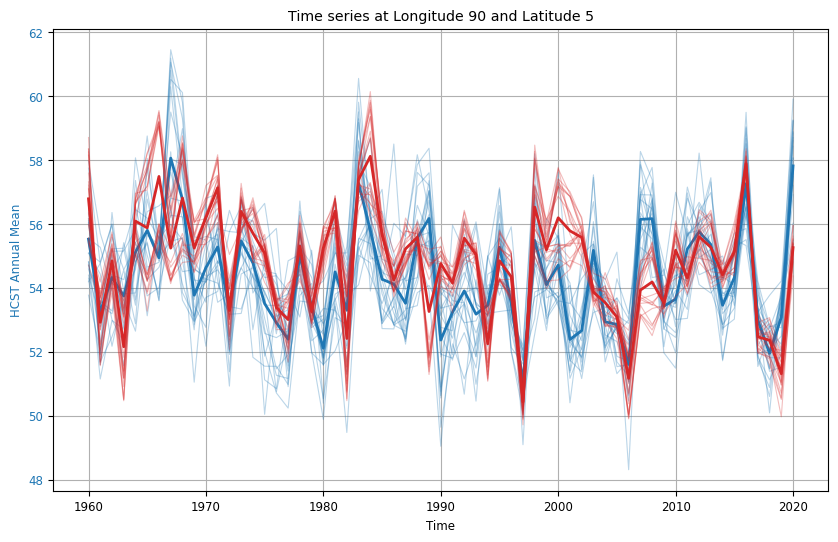

In [28]:
# 경도와 위도 설정 (예: 120W, 60S)
target_lon = 90
target_lat = 5

# Step 1: obs_annual_mean에서 해당 좌표의 타임시리즈 추출
distance_obs = np.sqrt((obs_annual_mean.TLONG - target_lon)**2 + (obs_annual_mean.TLAT - target_lat)**2)
min_distance_idx_obs = np.unravel_index(np.argmin(distance_obs.values), distance_obs.shape)
nlat_idx_obs, nlon_idx_obs = min_distance_idx_obs

# HCST 및 ODA 데이터 추출
hcst_full_timeseries_data = hcst_full_ly1_annual_mean.sel(nlon=nlon_idx_obs, nlat=nlat_idx_obs)
oda_full_timeseries_data = oda_full_annual_mean[cfg_var.var].sel(nlon=nlon_idx_obs, nlat=nlat_idx_obs)

# Step 2: HCST 및 ODA의 ensemble 평균 계산
hcst_full_timeseries_data_mean = hcst_full_timeseries_data.mean(dim='ens_HCST')
oda_full_timeseries_data_mean = oda_full_timeseries_data.mean(dim='ens_ODA')

# Step 3: 두 타임시리즈를 각각 왼쪽과 오른쪽 Y축에 플로팅
fig, ax1 = plt.subplots(figsize=(10, 6))

# 왼쪽 Y축 (HCST ensemble mean)
color = 'tab:blue'
ax1.set_xlabel('Time')
ax1.set_ylabel('HCST Annual Mean', color=color)
ax1.plot(hcst_full_timeseries_data_mean['year'], hcst_full_timeseries_data_mean, color=color, label='HCST Ensemble Mean', linewidth=2)
ax1.tick_params(axis='y', labelcolor=color)
ax1.grid(True)

# HCST 개별 ensemble 멤버들을 얇은 선으로 플롯
for ens in hcst_full_timeseries_data['ens_HCST']:
    ax1.plot(hcst_full_timeseries_data['year'], hcst_full_timeseries_data.sel(ens_HCST=ens), color=color, alpha=0.3, linewidth=0.8)

color = 'tab:red'
ax1.plot(oda_full_timeseries_data_mean['year'], oda_full_timeseries_data_mean, color=color, label='ODA Ensemble Mean', linewidth=2)

# ODA 개별 ensemble 멤버들을 얇은 선으로 플롯
for ens in oda_full_timeseries_data['ens_ODA']:
    ax1.plot(oda_full_timeseries_data['year'], oda_full_timeseries_data.sel(ens_ODA=ens), color=color, alpha=0.3, linewidth=0.8)

# 제목 설정
plt.title(f"Time series at Longitude {target_lon} and Latitude {target_lat}")

# 플롯 표시
plt.show()

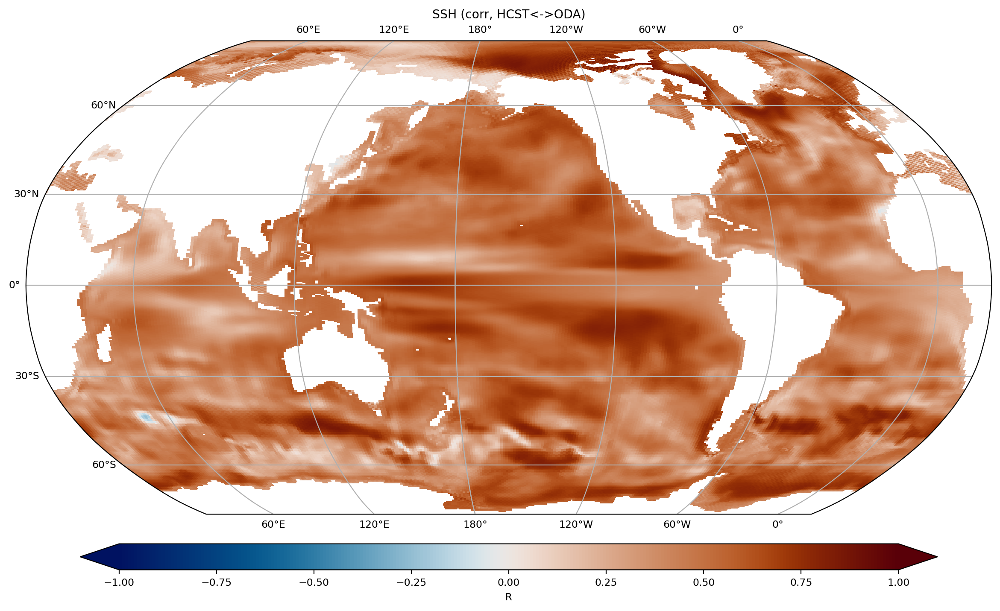

elasped time for plot: 7.1888957023620605


In [29]:
# plot for HCST (LY1, potential predictability, all member)

start_time = time.time()

varn=cfg_var.var #example

if cfg_var.comp=='ocn':
    ds_grid = pop_tools.get_grid('POP_gx1v7')

# data_array=pp_HCST.mean(dim='ens_HCST').mean(dim='ens_ODA')
data_array = pp_HCST.stack(ens_combined=('ens_HCST', 'ens_ODA')).median(dim='ens_combined')
data_array.attrs['name'] = cfg_var.var

if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT

projection = ccrs.Robinson(central_longitude=200)

plt.rcParams.update({'font.size': 8.5})
fig, ax2 = plt.subplots(1, 1, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection})

cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}
if cfg_var.comp=='ocn' or cfg_var.comp=='ice':
    plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, cbar_kwargs=cbar_kwargs)
else:
    plt1=data_array.isel(concat_dim=0).mean(dim='time').plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), vmax=30, vmin=0, cmap=cmocean.cm.deep, cbar_kwargs=cbar_kwargs)

ax2.set_title(f'{varn} (corr, HCST<->ODA)')
ax2.gridlines(draw_labels=True) 

ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for plot: ' + str(elapsed_time))

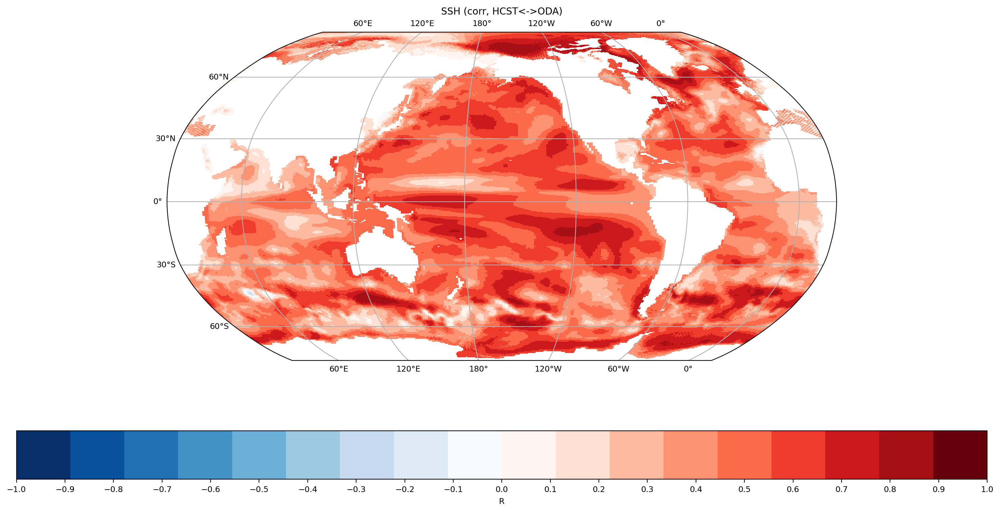

elasped time for plot: 6.94904088973999


In [30]:
# plot for HCST (LY1, potential predictability, all member)

start_time = time.time()

varn=cfg_var.var #example

if cfg_var.comp=='ocn':
    ds_grid = pop_tools.get_grid('POP_gx1v7')

# data_array=pp_HCST.mean(dim='ens_HCST').mean(dim='ens_ODA')
data_array = pp_HCST.stack(ens_combined=('ens_HCST', 'ens_ODA')).median(dim='ens_combined')
data_array.attrs['name'] = cfg_var.var

if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT

projection = ccrs.Robinson(central_longitude=200)

# 색상 범위를 정의합니다. -1에서 1까지 10개의 구간을 가집니다.
cmap_colors = [
    '#08306B', '#08519C', '#2171B5', '#4292C6', '#6BAED6', '#9ECAE1', '#C6DBEF', '#DEEBF7', '#F7FBFF',
    '#FFF5F0', '#FEE0D2', '#FCBBA1', '#FC9272', '#FB6A4A', '#EF3B2C', '#CB181D', '#A50F15', '#67000D'
]
# 컬러 맵과 범위를 정의합니다.
cmap = mcolors.ListedColormap(cmap_colors)
bounds = np.linspace(-1, 1, len(cmap_colors)+1)
norm = mcolors.BoundaryNorm(boundaries=bounds, ncolors=cmap.N, clip=True)

plt.rcParams.update({'font.size': 8.5})
fig, ax2 = plt.subplots(1, 1, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection})

if cfg_var.comp=='ocn' or cfg_var.comp=='ice':
    plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cmap, add_colorbar=False)
else:
    plt1=data_array.isel(concat_dim=0).mean(dim='time').plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), vmax=30, vmin=0, cmap=cmocean.cm.deep, cbar_kwargs=cbar_kwargs)

# cbar_a_c = fig.add_axes([0.15, 0.95, 0.7, 0.02])  # [left, bottom, width, height] 비율로 컬러바 위치와 크기 설정


cbar1 = fig.colorbar(plt1, cmap=cmap, norm=norm, boundaries=bounds, ticks=bounds, spacing='uniform', orientation='horizontal')
cbar1.set_ticks(np.linspace(-1, 1, 21))  # -1에서 1까지 20개 구간으로 틱 설정
cbar1.set_label('R')

ax2.set_title(f'{varn} (corr, HCST<->ODA)')
ax2.gridlines(draw_labels=True) 

ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for plot: ' + str(elapsed_time))



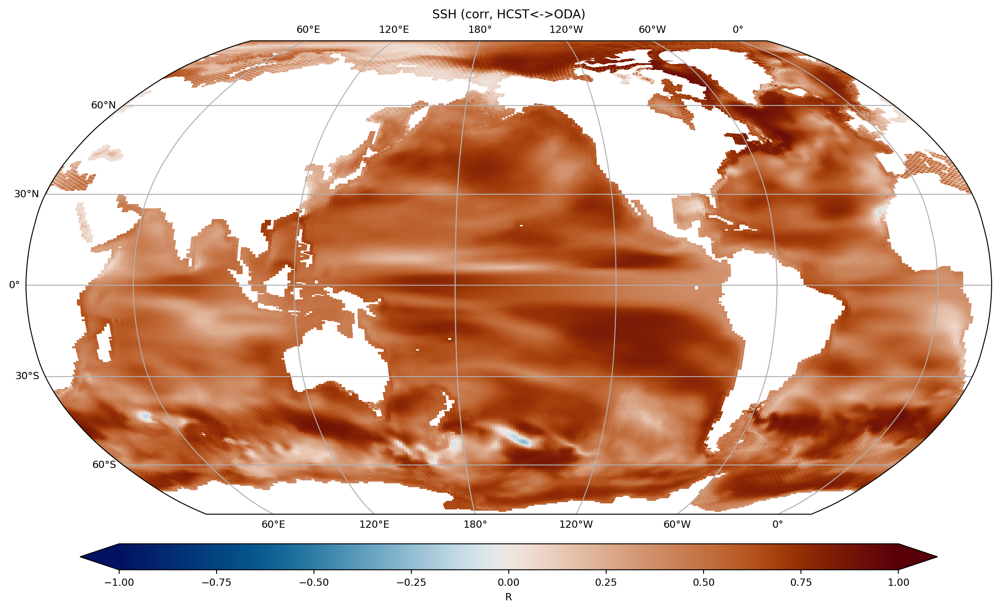

elasped time for plot: 4.686842918395996


In [31]:
# plot for HCST (LY1, potential predictability, projd only)

start_time = time.time()

varn=cfg_var.var #example

if cfg_var.comp=='ocn':
    ds_grid = pop_tools.get_grid('POP_gx1v7')

# # ens_HCST 차원에서 0~10 인덱스에 해당하는 값들을 선택
# data_array = pp_HCST.isel(ens_HCST=slice(10, 20)).mean(dim='ens_HCST')
# # ens_ODA 차원에서도 0~10 인덱스를 선택하고 평균 계산
# data_array = data_array.isel(ens_ODA=slice(10, 20)).mean(dim='ens_ODA')

data_array = pp_HCST.isel(ens_HCST=slice(10, 20), ens_ODA=slice(10, 20)).stack(ens_combined=('ens_HCST', 'ens_ODA')).median(dim='ens_combined')

data_array.attrs['name'] = cfg_var.var

if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT

projection = ccrs.Robinson(central_longitude=200)

plt.rcParams.update({'font.size': 8.5})
fig, ax2 = plt.subplots(1, 1, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection})

cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}
if cfg_var.comp=='ocn' or cfg_var.comp=='ice':
    plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, cbar_kwargs=cbar_kwargs)
else:
    plt1=data_array.isel(concat_dim=0).mean(dim='time').plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), vmax=30, vmin=0, cmap=cmocean.cm.deep, cbar_kwargs=cbar_kwargs)

ax2.set_title(f'{varn} (corr, HCST<->ODA)')
ax2.gridlines(draw_labels=True) 

ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for plot: ' + str(elapsed_time))

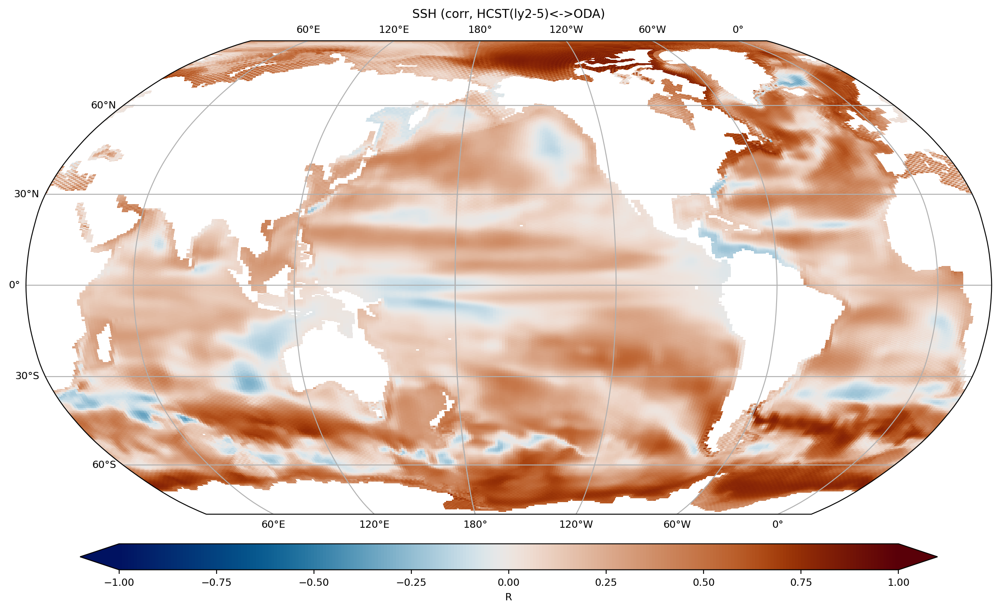

elasped time for plot: 4.719558477401733


In [32]:
# plot for HCST (LY2-5, potential predictability, all member)

start_time = time.time()

varn=cfg_var.var #example

if cfg_var.comp=='ocn':
    ds_grid = pop_tools.get_grid('POP_gx1v7')

data_array=pp_HCST_ly2_5.mean(dim='ens_HCST').mean(dim='ens_ODA')

data_array.attrs['name'] = cfg_var.var

if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT

projection = ccrs.Robinson(central_longitude=200)

plt.rcParams.update({'font.size': 8.5})
fig, ax2 = plt.subplots(1, 1, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection})

cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}
if cfg_var.comp=='ocn' or cfg_var.comp=='ice':
    plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, cbar_kwargs=cbar_kwargs)
else:
    plt1=data_array.isel(concat_dim=0).mean(dim='time').plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), vmax=30, vmin=0, cmap=cmocean.cm.deep, cbar_kwargs=cbar_kwargs)

ax2.set_title(f'{varn} (corr, HCST(ly2-5)<->ODA)')
ax2.gridlines(draw_labels=True) 

ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for plot: ' + str(elapsed_time))

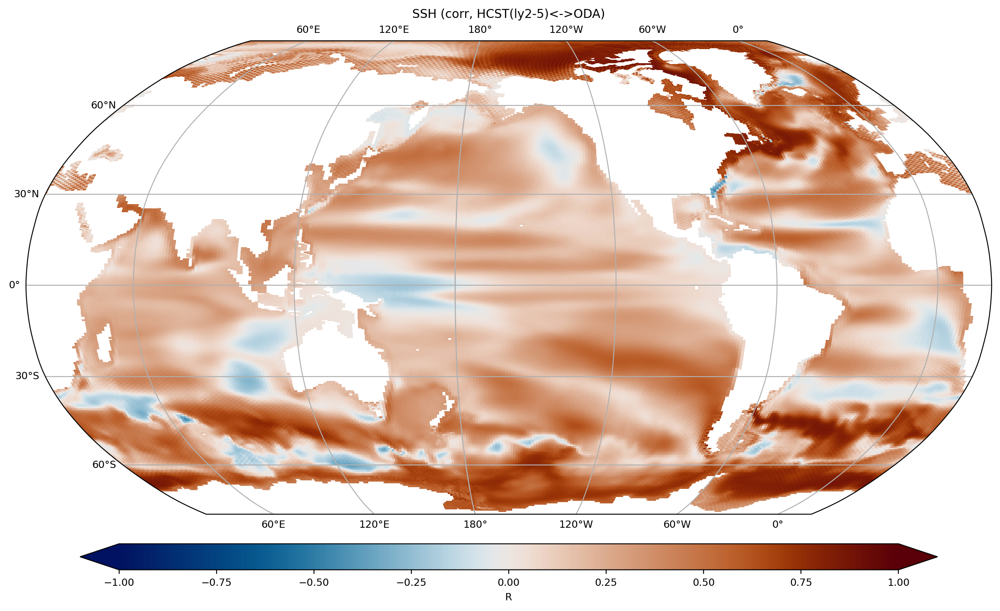

elasped time for plot: 4.309515714645386


In [33]:
# plot for HCST (LY2-5, potential predictability, projd only)

start_time = time.time()

varn=cfg_var.var #example

if cfg_var.comp=='ocn':
    ds_grid = pop_tools.get_grid('POP_gx1v7')

data_array = pp_HCST_ly2_5.isel(ens_HCST=slice(10, 20)).mean(dim='ens_HCST')
data_array = data_array.isel(ens_ODA=slice(10, 20)).mean(dim='ens_ODA')

data_array.attrs['name'] = cfg_var.var

if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT

projection = ccrs.Robinson(central_longitude=200)

plt.rcParams.update({'font.size': 8.5})
fig, ax2 = plt.subplots(1, 1, figsize=(18.5, 9), dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection})

cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}
if cfg_var.comp=='ocn' or cfg_var.comp=='ice':
    plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', ax=ax2, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, cbar_kwargs=cbar_kwargs)
else:
    plt1=data_array.isel(concat_dim=0).mean(dim='time').plot.pcolormesh(ax=ax2, transform=ccrs.PlateCarree(), vmax=30, vmin=0, cmap=cmocean.cm.deep, cbar_kwargs=cbar_kwargs)

ax2.set_title(f'{varn} (corr, HCST(ly2-5)<->ODA)')
ax2.gridlines(draw_labels=True) 

ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for plot: ' + str(elapsed_time))

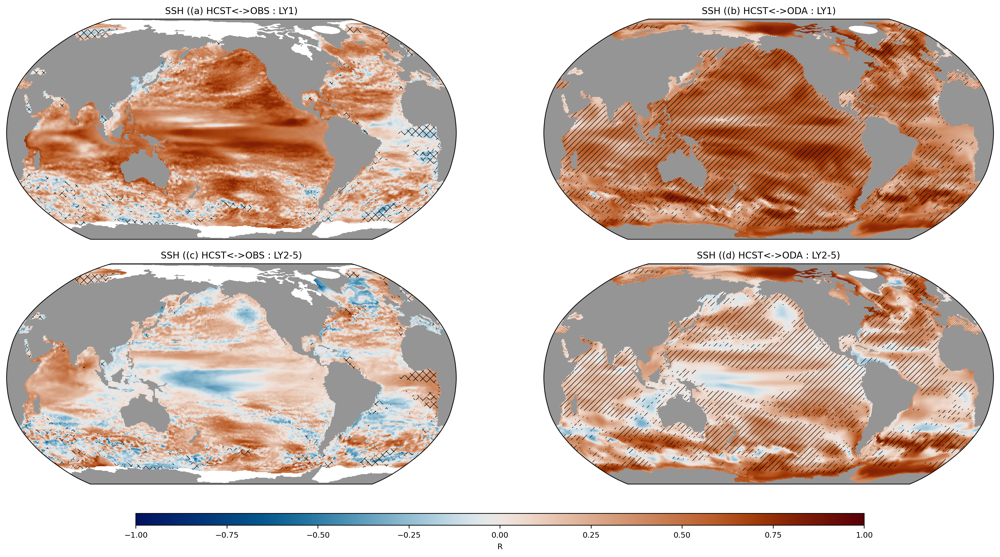

elasped time for plot: 123.52693676948547


In [34]:
# practice for panels (without box)

start_time = time.time()


varn=cfg_var.var #example

data_array=corr_HCST.median(dim='ens_HCST')
mask_land = np.isnan(data_array)  # 육지(NaN인 지역)
mask_land_numeric = mask_land.astype(int)
data_array = data_array.where(cfg_var.OBS_ds['mask_80_percent'] == True, np.nan)
mask_land_sat = mask_land.where(cfg_var.OBS_ds['mask_80_percent'] == True, np.nan)
data_array.attrs['name'] = cfg_var.var
if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT
    mask_land_numeric['TLONG']=ds_grid.TLONG
    mask_land_numeric['TLAT']=ds_grid.TLAT

if cfg_var.comp=='ocn':
    ds_grid = pop_tools.get_grid('POP_gx1v7')

projection = ccrs.Robinson(central_longitude=205)
cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(18.5, 9), 
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=False)

# significant mask for ODA-LE corr > 0 
alpha = 0.10
t_stat_ODA, p_values_ODA = ttest_1samp(corr_ODA_diff, 0, axis=0)
# ds_ODA = corr_ODA_diff.mean(dim='ens_ODA').where(p_values_ODA < alpha)
ds_ODA = corr_ODA_diff.mean(dim='ens_ODA').where(p_values_ODA < alpha)

threshold = 0
mask_ODA = ds_ODA > threshold
mask_ODA_indices = np.where(mask_ODA)

# t_stat_HCST, p_values_HCST = ttest_1samp(corr_HCST, 0, axis=0)
# ds_HCST = corr_HCST.mean(dim='ens_HCST').where(p_values_HCST < alpha)
# threshold = 0
# mask_HCST = ds_HCST > threshold 

# grid_spacing_HCST = 10
# mask_HCST_land = mask_HCST & ~mask_land  # mask_ODA가 False이면서 육지가 아닌 지역
# HCST_valid_indices = np.where(mask_HCST_land)
# HCST_coarse_valid_indices = (HCST_valid_indices[0][::grid_spacing_HCST], HCST_valid_indices[1][::grid_spacing_HCST])

HCST_data_array_masked = data_array.where(mask_ODA)

# 그리드 간격 설정 (예: 5씩 건너뛰기)
grid_spacing = 1
mask_not_ODA_land = ~mask_ODA & ~mask_land  # mask_ODA가 False이면서 육지가 아닌 지역
not_valid_indices = np.where(mask_not_ODA_land)
coarse_not_valid_indices = (not_valid_indices[0][::grid_spacing], not_valid_indices[1][::grid_spacing])


# axes[0,0]: plot for actual skill (LY1, all members)

plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', 
                ax=axes[0, 0], transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, add_colorbar=False)
# sct1 = axes[0, 0].scatter(ds_grid.TLONG.values[mask_ODA_indices], ds_grid.TLAT.values[mask_ODA_indices], 
#                           color='black', marker='o', s=0.1, alpha=0.2, transform=ccrs.PlateCarree())
# hatch1 = axes[0, 0].scatter(ds_grid.TLONG.values[coarse_not_valid_indices], ds_grid.TLAT.values[coarse_not_valid_indices],
#                           color='black', marker='x', s=0.1, alpha=0.2, transform=ccrs.PlateCarree()) # works
hatch1 = pop_add_cyclic(data_array.where(~mask_ODA, np.nan)).plot.contourf(x='TLONG', y='TLAT', 
                    ax=axes[0, 0], transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['xxx'], add_colorbar=False) # works very well

land1 = pop_add_cyclic(mask_land_numeric.where(mask_land_numeric == 1, np.nan)).plot.pcolormesh(ax = axes[0,0], x='TLONG', y='TLAT', 
                  transform=ccrs.PlateCarree(), cmap='Greys', add_colorbar=False)

axes[0, 0].set_title(f'{varn} ((a) HCST<->OBS : LY1)')


# axes[0,1]:  plot for potential predictability (LY1, all members)
# data_array=pp_HCST.mean(dim='ens_HCST').mean(dim='ens_ODA')
data_array = pp_HCST.stack(ens_combined=('ens_HCST', 'ens_ODA')).median(dim='ens_combined')
data_array.attrs['name'] = cfg_var.var
if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT
    
plt2=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', 
                    ax=axes[0, 1], transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, add_colorbar=False)
# hatch2 = axes[0, 1].scatter(ds_grid.TLONG.values[HCST_coarse_valid_indices], ds_grid.TLAT.values[HCST_coarse_valid_indices],
#                           color='black', marker='o', s=5, alpha=0.1, transform=ccrs.PlateCarree())
# contour2 = axes[0,1].contour(data_array.TLONG, data_array.TLAT, HCST_data_array_masked, levels=[0], colors='black', transform=ccrs.PlateCarree())  # doesn't work
# contour2 = pop_add_cyclic(HCST_data_array_masked).plot.contourf(x='TLONG', y='TLAT', 
#                     ax=axes[0, 1], transform=ccrs.PlateCarree(), levels=[0,1], colors = 'none', hatches=['/']) # works but weird
# contour2 = pop_add_cyclic(HCST_data_array_masked.where(HCST_data_array_masked > 0, np.nan)).plot.contourf(x='TLONG', y='TLAT', 
#                     ax=axes[0, 1], transform=ccrs.PlateCarree(), levels=[0,1], colors = 'black', alpha=0.2, add_colorbar=False) # works well
contour2 = pop_add_cyclic(HCST_data_array_masked.where(HCST_data_array_masked > 0, np.nan)).plot.contourf(x='TLONG', y='TLAT', 
                    ax=axes[0, 1], transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well
# contour2 = pop_add_cyclic(HCST_data_array_masked.where(HCST_data_array_masked > 0, np.nan)).plot.contourf(x='TLONG', y='TLAT', 
#                     ax=axes[0, 1], transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['o'], add_colorbar=False) # works

land2 = pop_add_cyclic(mask_land_numeric.where(mask_land_numeric == 1, np.nan)).plot.pcolormesh(
    ax = axes[0,1], x='TLONG', y='TLAT', transform=ccrs.PlateCarree(), cmap='Greys', add_colorbar=False)

# 3*3 interpolate and plot
# # Step 1: 1D로 펼친 경도, 위도, 데이터 값 추출
# points = np.array([ds_grid.TLONG.values.ravel(), ds_grid.TLAT.values.ravel()]).T
# values = HCST_data_array_masked.values.ravel()
# # Step 2: 3도 해상도의 격자 생성 (목표 경도와 위도)
# lon_new = np.arange(-180, 180.1, 3)  # 3도 간격의 경도
# lat_new = np.arange(-90, 90.1, 3)    # 3도 간격의 위도
# lon_grid, lat_grid = np.meshgrid(lon_new, lat_new)
# # Step 3: SciPy의 griddata를 사용하여 보간 수행
# data_interp = griddata(points, values, (lon_grid, lat_grid), method='linear')
# # Step 4: 새로운 격자에 맞는 xarray.DataArray 생성
# data_interp_da = xr.DataArray(data_interp, coords=[lat_new, lon_new], dims=["lat", "lon"])
# contour2 = axes[0,1].contourf(lon_grid, lat_grid, data_interp_da, levels=[0,1], colors='black', transform=ccrs.PlateCarree())


axes[0, 1].set_title(f'{varn} ((b) HCST<->ODA : LY1)')


# axes[1,0]:  plot for actual skill (LY2-5, all members)
data_array=corr_HCST_ly2_5.median(dim='ens_HCST')
data_array = data_array.where(cfg_var.OBS_ds['mask_80_percent'] == True, np.nan)
data_array.attrs['name'] = cfg_var.var
if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT

# t_stat_HCST, p_values_HCST = ttest_1samp(corr_HCST_ly2_5, 0, axis=0)
# ds_HCST = corr_HCST_ly2_5.mean(dim='ens_HCST').where(p_values_HCST < alpha)
# threshold = 0
# mask_HCST = ds_HCST > threshold 

# mask_HCST_land = mask_HCST & ~mask_land  # mask_ODA가 False이면서 육지가 아닌 지역
# HCST_valid_indices = np.where(mask_HCST_land)
# HCST_coarse_valid_indices = (HCST_valid_indices[0][::grid_spacing_HCST], HCST_valid_indices[1][::grid_spacing_HCST])

HCST_data_array_masked = data_array.where(mask_ODA)

plt3=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', 
                    ax=axes[1, 0], transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, add_colorbar=False)
# sct3 = axes[1, 0].scatter(ds_grid.TLONG.values[mask_ODA_indices], ds_grid.TLAT.values[mask_ODA_indices], 
#                           color='black', marker='o', s=0.1, alpha=0.2, transform=ccrs.PlateCarree())
# hatch3 = axes[1, 0].scatter(ds_grid.TLONG.values[coarse_not_valid_indices], ds_grid.TLAT.values[coarse_not_valid_indices],
#                           color='black', marker='x', s=0.1, alpha=0.2, transform=ccrs.PlateCarree())
hatch3 = pop_add_cyclic(data_array.where(~mask_ODA, np.nan)).plot.contourf(x='TLONG', y='TLAT', 
                    ax=axes[1, 0], transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['xxx'], add_colorbar=False) # works very well
land3 = pop_add_cyclic(mask_land_numeric.where(mask_land_numeric == 1, np.nan)).plot.pcolormesh(
    ax = axes[1,0], x='TLONG', y='TLAT', transform=ccrs.PlateCarree(), cmap='Greys', add_colorbar=False)

axes[1, 0].set_title(f'{varn} ((c) HCST<->OBS : LY2-5)')


# axes[1,1]:  plot for actual skill (LY2-5, all members)
# data_array=pp_HCST_ly2_5.mean(dim='ens_HCST').mean(dim='ens_ODA')
data_array = pp_HCST_ly2_5.stack(ens_combined=('ens_HCST', 'ens_ODA')).median(dim='ens_combined')
data_array.attrs['name'] = cfg_var.var
if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT
    
plt4=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', 
                    ax=axes[1, 1], transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, add_colorbar=False)
# hatch4 = axes[1, 1].scatter(ds_grid.TLONG.values[HCST_coarse_valid_indices], ds_grid.TLAT.values[HCST_coarse_valid_indices],
#                           color='black', marker='o', s=5, alpha=0.1, transform=ccrs.PlateCarree())
contour4 = pop_add_cyclic(HCST_data_array_masked.where(HCST_data_array_masked > 0, np.nan)).plot.contourf(x='TLONG', y='TLAT', 
                    ax=axes[1, 1], transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well
land4 = pop_add_cyclic(mask_land_numeric.where(mask_land_numeric == 1, np.nan)).plot.pcolormesh(
    ax = axes[1,1], x='TLONG', y='TLAT', transform=ccrs.PlateCarree(), cmap='Greys', add_colorbar=False)


axes[1, 1].set_title(f'{varn} ((d) HCST<->ODA : LY2-5)')

# plot for (WND ODA mask)

# (a), (b), (c) 서브플롯에 대해 위쪽에 큰 컬러바 추가
cbar_a_c = fig.add_axes([0.2, 0.05, 0.6, 0.02])  # [left, bottom, width, height] 비율로 컬러바 위치와 크기 설정
cbar1 = fig.colorbar(plt1, cax=cbar_a_c, orientation='horizontal')
cbar1.set_label('R')

plt.rcParams.update({'font.size': 12})
plt.rcParams['hatch.linewidth'] = 0.5  # 기본값은 1.0, hatch linewidth 조절

# 전체 레이아웃 조정
plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.95])  # 상단과 하단의 레이아웃 여백을 맞추기 위해 rect 설정 [left bottom right top]
# plt.tight_layout()

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for plot: ' + str(elapsed_time))

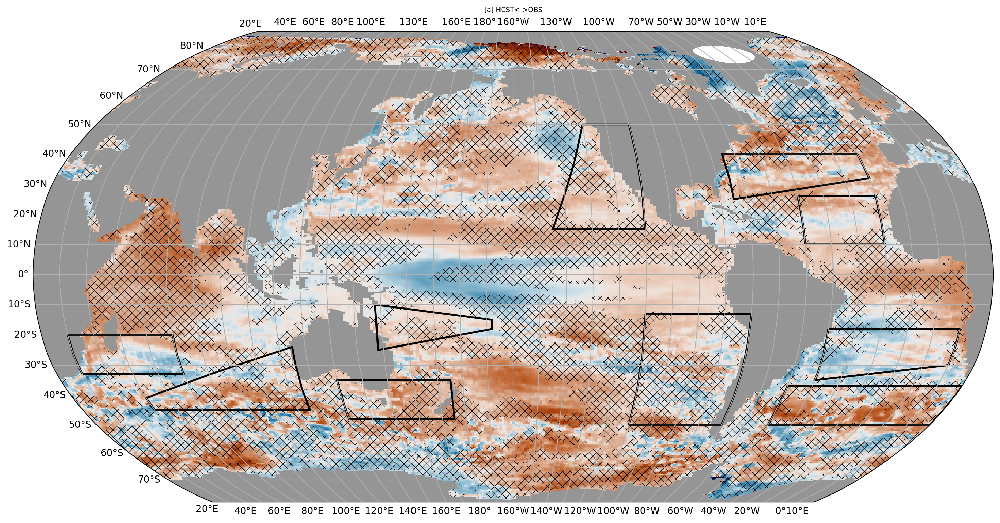

elasped time for plot: 31.939844369888306


In [76]:
# practice for panels (with boxes)

start_time = time.time()

varn=cfg_var.var #example

# data_array=corr_HCST.mean(dim='ens_HCST')
data_array=corr_HCST_ly2_5.median(dim='ens_HCST')

mask_land = np.isnan(data_array)  # 육지(NaN인 지역)
mask_land_numeric = mask_land.astype(int)
# data_array = data_array.where(cfg_var.OBS_ds['mask_80_percent'] == True, np.nan)
# mask_land_sat = mask_land.where(cfg_var.OBS_ds['mask_80_percent'] == True, np.nan)
data_array.attrs['name'] = cfg_var.var
if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT
    mask_land_numeric['TLONG']=ds_grid.TLONG
    mask_land_numeric['TLAT']=ds_grid.TLAT

if cfg_var.comp=='ocn':
    ds_grid = pop_tools.get_grid('POP_gx1v7')

projection = ccrs.Robinson(central_longitude=200)
cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(18.5, 9), 
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=False)

# significant mask for ODA-LE corr > 0 
alpha = 0.10
t_stat_ODA, p_values_ODA = ttest_1samp(corr_ODA_diff_NPP, 0, axis=0)
ds_ODA = corr_ODA_diff_NPP.mean(dim='ens_ODA').where(p_values_ODA < alpha)
threshold = 0
mask_ODA = ds_ODA > threshold
mask_ODA_indices = np.where(mask_ODA)

HCST_data_array_masked = data_array.where(mask_ODA)

# 그리드 간격 설정 (예: 5씩 건너뛰기)
grid_spacing = 1
mask_not_ODA_land = ~mask_ODA & ~mask_land  # mask_ODA가 False이면서 육지가 아닌 지역
not_valid_indices = np.where(mask_not_ODA_land)
coarse_not_valid_indices = (not_valid_indices[0][::grid_spacing], not_valid_indices[1][::grid_spacing])

plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', 
                ax=axes, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, add_colorbar=False)
hatch1 = pop_add_cyclic(data_array.where(~mask_ODA, np.nan)).plot.contourf(x='TLONG', y='TLAT', 
                    ax=axes, transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['xxx'], add_colorbar=False) # works very well

land1 = pop_add_cyclic(mask_land_numeric.where(mask_land_numeric == 1, np.nan)).plot.pcolormesh(ax = axes, x='TLONG', y='TLAT', 
                  transform=ccrs.PlateCarree(), cmap='Greys', add_colorbar=False)

# axes.gridlines(draw_labels=True) 
# axes.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
# axes.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

# 경도, 위도 그리드라인 추가
gridlines = axes.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)

# 10도 간격으로 그리드 설정
gridlines.xlocator = mticker.FixedLocator(np.arange(-180, 181, 10))  # 경도는 -180도에서 180도까지 10도 간격
gridlines.ylocator = mticker.FixedLocator(np.arange(-90, 91, 10))    # 위도는 -90도에서 90도까지 10도 간격

# 그리드 라벨 포맷 지정 (위도, 경도 포맷)
gridlines.xlabel_style = {'size': 10, 'color': 'black'}
gridlines.ylabel_style = {'size': 10, 'color': 'black'}

axes.set_title('[a] HCST<->OBS')


# 1. Madagascar
trapezoid_coords = [
    [30.0, -33],  # 왼쪽 아래
    [70, -33],  # 오른쪽 아래
    [70, -20],  # 오른쪽 위
    [30, -20]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

#2. SEIO
trapezoid_coords = [
    [50, -45],  # 왼쪽 아래
    [115, -45],  # 오른쪽 아래
    [115, -24],  # 오른쪽 위
    [50, -41]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

#3. Tasmania
trapezoid_coords = [
    [130, -48],  # 왼쪽 아래
    [175, -48],  # 오른쪽 아래
    [175, -35],  # 오른쪽 위
    [130, -35]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

#4. SWSP
trapezoid_coords = [
    [148, -25],  # 왼쪽 아래
    [192, -18],  # 오른쪽 아래
    [192, -15],  # 오른쪽 위
    [148, -10]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

#5. NEP
trapezoid_coords = [
    [215, 15],  # 왼쪽 아래
    [250, 15],  # 오른쪽 아래
    [250, 50],  # 오른쪽 위
    [230, 50]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

#6. SEP
trapezoid_coords = [
    [250, -50],  # 왼쪽 아래
    [290, -50],  # 오른쪽 아래
    [290, -13],  # 오른쪽 위
    [250, -13]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

#7. NWA
trapezoid_coords = [
    [-75, 25],  # 왼쪽 아래
    [-20, 32],  # 오른쪽 아래
    [-20, 40],  # 오른쪽 위
    [-75, 40]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

#8. NEA
trapezoid_coords = [
    [-50, 10],  # 왼쪽 아래
    [-20, 10],  # 오른쪽 아래
    [-20, 26],  # 오른쪽 위
    [-50, 26]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

#9. SA
trapezoid_coords = [
    [-40, -35],  # 왼쪽 아래
    [10, -30],  # 오른쪽 아래
    [10, -18],  # 오른쪽 위
    [-40, -18]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)


#10. SO
trapezoid_coords = [
    [-50, -50],  # 왼쪽 아래
    [20, -50],  # 오른쪽 아래
    [20, -37],  # 오른쪽 위
    [-50, -37]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for plot: ' + str(elapsed_time))

In [77]:
obs_rolling_mean_masked = obs_rolling_mean.where(mask_ODA).compute()
oda_full_rolling_mean_masked = oda_full_rolling_mean.where(mask_ODA).compute()
le_full_rolling_mean_masked = le_full_rolling_mean.where(mask_ODA).compute()
hcst_full_ly2_5_annual_mean_masked = hcst_full_ly2_5_annual_mean.where(mask_ODA).compute()

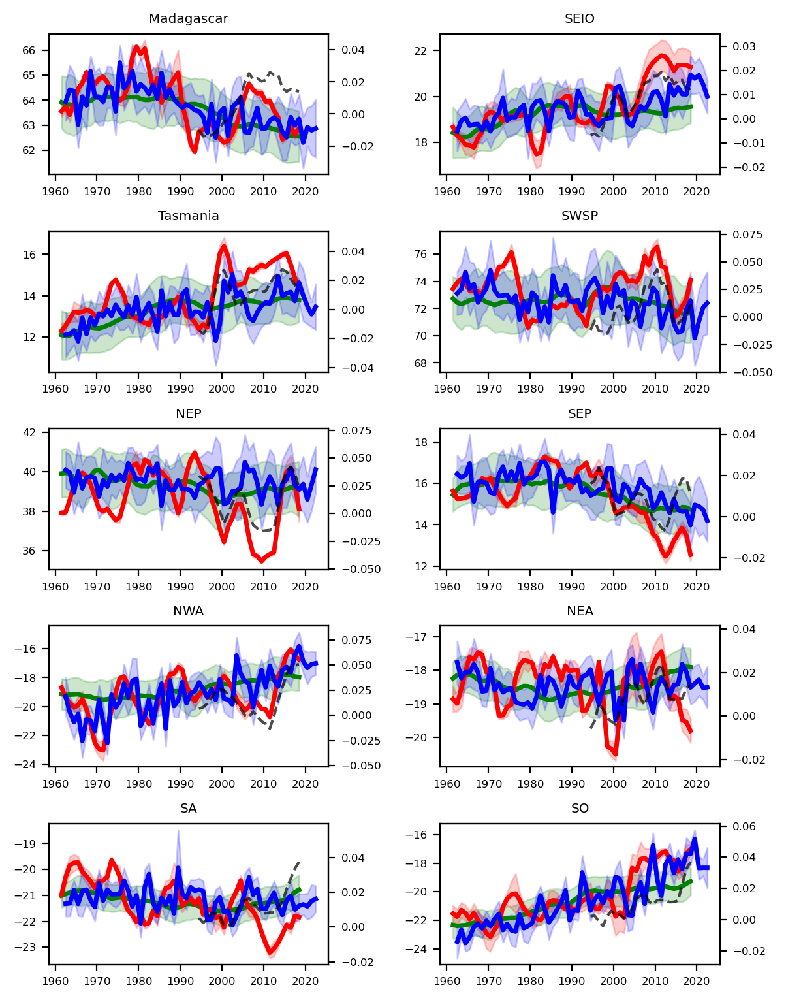

In [78]:
def create_trapezoid_path(coords):
    """사다리꼴 좌표를 받아 경로 생성"""
    return mpath.Path(coords)

def filter_region_by_trapezoid(coords, lons, lats, data):
    """사다리꼴 경로 내부에 있는 점들을 필터링"""
    trapezoid_path = create_trapezoid_path(coords)
    points = np.vstack((lons.ravel(), lats.ravel())).T
    inside_trapezoid = trapezoid_path.contains_points(points).reshape(lons.shape)
    return data.where(inside_trapezoid)

def plot_time_series(ax, ax2, le_time_series_data, oda_time_series_data, hcst_time_series_data, obs_time_series_data, cfg_var):
    """한 subplot에 대한 time series 및 fill_between 플롯 생성"""
    # LE
    ax.fill_between(le_time_series_data.year.values, 
                    le_time_series_data.mean(dim='ens_LE')[cfg_var.var].values - le_time_series_data.std(dim='ens_LE')[cfg_var.var].values,
                    le_time_series_data.mean(dim='ens_LE')[cfg_var.var].values + le_time_series_data.std(dim='ens_LE')[cfg_var.var].values,
                    color='green', alpha=0.2)
    ax.plot(le_time_series_data.year.values, le_time_series_data.mean(dim='ens_LE')[cfg_var.var].values, color='green', linewidth=2.5)
    
    # ODA
    ax.fill_between(oda_time_series_data.year.values, 
                    oda_time_series_data.mean(dim='ens_ODA')[cfg_var.var].values - oda_time_series_data.std(dim='ens_ODA')[cfg_var.var].values,
                    oda_time_series_data.mean(dim='ens_ODA')[cfg_var.var].values + oda_time_series_data.std(dim='ens_ODA')[cfg_var.var].values,
                    color='red', alpha=0.2)
    ax.plot(oda_time_series_data.year.values, oda_time_series_data.mean(dim='ens_ODA')[cfg_var.var].values, color='red', linewidth=2.5)

    # HCST
    ax.fill_between(hcst_time_series_data.year.values, 
                    hcst_time_series_data.mean(dim='ens_HCST').values - hcst_time_series_data.std(dim='ens_HCST').values,
                    hcst_time_series_data.mean(dim='ens_HCST').values + hcst_time_series_data.std(dim='ens_HCST').values,
                    color='blue', alpha=0.2)
    ax.plot(hcst_time_series_data.year.values, hcst_time_series_data.mean(dim='ens_HCST').values, color='blue', linewidth=2.5)

    # OBS
    ax2.plot(obs_time_series_data.year.values, obs_time_series_data[cfg_var.var].values, 
             color='black', alpha=0.7, linewidth=1.5, linestyle='--')
    
    # y축 범위 조정
    ymin, ymax = ax2.get_ylim()
    ax2.set_ylim(ymin - (ymax - ymin) / 2, ymax + (ymax - ymin) / 2)

def process_region(ax, ax2, coords, lons, lats, cfg_var, le_data, oda_data, hcst_data, obs_data):
    """영역을 필터링하고 플로팅"""
    le_filtered = filter_region_by_trapezoid(coords, lons, lats, le_data)
    oda_filtered = filter_region_by_trapezoid(coords, lons, lats, oda_data)
    hcst_filtered = filter_region_by_trapezoid(coords, lons, lats, hcst_data)
    obs_filtered = filter_region_by_trapezoid(coords, lons, lats, obs_data)

    # 위도에 따른 가중치 적용 후 평균 계산
    weights = np.cos(np.deg2rad(obs_filtered['TLAT']))
    le_time_series_data = le_filtered.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()
    oda_time_series_data = oda_filtered.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()
    hcst_time_series_data = hcst_filtered.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()
    obs_time_series_data = obs_filtered.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()

    plot_time_series(ax, ax2, le_time_series_data, oda_time_series_data, hcst_time_series_data, obs_time_series_data, cfg_var)

# 좌표 설정 (사전으로 관리)
regions = {
    "Madagascar": [[30.0, -33], [70, -33], [70, -20], [30, -20]],
    "SEIO": [[50, -45], [115, -45], [115, -24], [50, -41]],
    "Tasmania": [[130, -48], [175, -48], [175, -35], [130, -35]],
    "SWSP": [[148, -25], [192, -18], [192, -15], [148, -10]],
    "NEP": [[215, 15], [250, 15], [250, 50], [230, 50]],
    "SEP": [[250, -50], [290, -50], [290, -13], [250, -13]],
    "NWA": [[285, 25], [340, 32], [340, 40], [285, 40]],
    "NEA": [[310, 10], [340, 10], [340, 26], [310, 26]],
    "SA": [[-40, -35], [10, -30], [10, -18], [-40, -18]],
    "SO": [[-50, -50], [20, -50], [20, -37], [-50, -37]],
}

# 그림 생성
fig, ax = plt.subplots(nrows=5, ncols=2, figsize=(6, 6*1.414), dpi=200, constrained_layout=False)
lons = cfg_var.OBS_ds.TLONG.values
lats = cfg_var.OBS_ds.TLAT.values

# 영역에 대해 반복 처리
for idx, (region_name, coords) in enumerate(regions.items()):
    i, j = divmod(idx, 2)
    ax2 = ax[i, j].twinx()  # 새로운 축 생성
    process_region(ax[i, j], ax2, coords, lons, lats, cfg_var, le_full_rolling_mean_masked, oda_full_rolling_mean_masked, hcst_full_ly2_5_annual_mean_masked, obs_rolling_mean_masked)
    ax[i, j].set_title(region_name)

# Legend
# lines_ax, labels_ax = ax[0,0].get_legend_handles_labels()  # ax에서 line과 label 가져오기
# lines_ax2, labels_ax2 = ax2.get_legend_handles_labels()  # ax2에서 line과 label 가져오기
# fig.legend(lines_ax + lines_ax2, labels_ax + labels_ax2, loc='upper center', bbox_to_anchor=(0.5, 0), ncol=2)  # 아래쪽 바깥에 배치

# 전체 플롯 관련 설정
plt.rcParams.update({'font.size': 6})
plt.tight_layout(rect=[0, 0, 1, 0.9])
plt.subplots_adjust(hspace=0.4, wspace=0.4) # vertical, horizontal

plt.show()